# 3M OTPW DATA EDA 

In [0]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import pyspark
from pyspark.rdd import RDD
from pyspark.sql import Row, DataFrame
from pyspark.sql.types import NumericType
from pyspark.sql import functions as F

In [0]:
# Mount base directory
data_BASE_DIR = "dbfs:/mnt/mids-w261/"
display(dbutils.fs.ls(f"{data_BASE_DIR}"))

# otpw = (spark.read
#        .format("csv")
#        .option("header", "true")
#        .load(f"{data_BASE_DIR}/OTPW_3M_2015.csv"))
# duration = "3 Month"

# otpw = (spark.read
#            .format("csv")
#            .option("header", "true")
#            .load(f"{data_BASE_DIR}/OTPW_12M/OTPW_12M/OTPW_12M_2015.csv.gz"))
# duration = "1 Year"

otpw = spark.read.parquet("dbfs:/mnt/mids-w261/OTPW_60M_Backup/")
duration = "5 Year"

print("Shape of Data ->  rows:", otpw.count(), " / columns:", len(otpw.columns))

path,name,size,modificationTime
dbfs:/mnt/mids-w261/HW5/,HW5/,0,1765174244252
dbfs:/mnt/mids-w261/OTPW_12M/,OTPW_12M/,0,1765174244252
dbfs:/mnt/mids-w261/OTPW_1D_CSV/,OTPW_1D_CSV/,0,1765174244252
dbfs:/mnt/mids-w261/OTPW_36M/,OTPW_36M/,0,1765174244252
dbfs:/mnt/mids-w261/OTPW_3M/,OTPW_3M/,0,1765174244252
dbfs:/mnt/mids-w261/OTPW_3M_2015.csv,OTPW_3M_2015.csv,1500620247,1741625185000
dbfs:/mnt/mids-w261/OTPW_3M_2015_delta/,OTPW_3M_2015_delta/,0,1765174244252
dbfs:/mnt/mids-w261/OTPW_60M/,OTPW_60M/,0,1765174244252
dbfs:/mnt/mids-w261/OTPW_60M_Backup/,OTPW_60M_Backup/,0,1765174244252
dbfs:/mnt/mids-w261/airport-codes_csv.csv,airport-codes_csv.csv,6232459,1740508595000


Shape of Data ->  rows: 31673119  / columns: 214


## Record to Exclude

In [0]:
display(otpw.filter((F.col("origin_type") == "seaplane_base") | (F.col("dest_type") == "seaplane_base")))

DATE,FL_DATE,YEAR,MONTH,QUARTER,DAY_OF_MONTH,DAY_OF_WEEK,DEP_TIME,CRS_DEP_TIME,CRS_ARR_TIME,DEP_TIME_BLK,four_hours_prior_depart_UTC,two_hours_prior_depart_UTC,origin_airport_lat,origin_airport_lon,dest_airport_lat,dest_airport_lon,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,ORIGIN,origin_type,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,DEST,dest_type,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DISTANCE_GROUP,FLIGHTS,DISTANCE,AIR_TIME,ELEVATION,HourlyAltimeterSetting,HourlyDewPointTemperature,HourlyDryBulbTemperature,HourlyPrecipitation,HourlyRelativeHumidity,HourlySeaLevelPressure,HourlyStationPressure,HourlyVisibility,HourlyWetBulbTemperature,HourlyWindDirection,HourlyWindSpeed,origin_station_dis,dest_station_dis,DIVERTED,DEP_DELAY_GROUP,DEP_DELAY,HourlySkyConditions,IS_DEP_DELAY
2017-01-07T04:53:00Z,2017-01-06,2017,1,1,6,5,2345,2300,1,2300-2359,2017-01-07T04:00:00Z,2017-01-07T06:00:00Z,55.9,-133.3,33.5,-94.0,EV,20366,EV,TKI,seaplane_base,"Tokeen, AK",AK,2,TXK,medium_airport,"Texarkana, AR",AR,5,10,1,2429.0,95.0,3.7,29.76,17.0,34.0,0.0,50.0,29.76,29.71,10.0,28.0,30.0,11.0,23.779,0.0,1,3.0,45.0,cloudy,1


## Helper functions

In [0]:
# Function to check nulls for a dataframe
from pyspark.sql.functions import col, sum as _sum, when, count
def null_summary(df):
    total_rows = df.count()

    # Compute null count and percentage per column
    null_summary = df.select([
        _sum(when(col(c).isNull(), 1).otherwise(0)).alias(c)
        for c in df.columns
    ]).toPandas().T.reset_index()
    null_summary.columns = ["Column", "Null_Count"]
    null_summary["Null_%"] = (null_summary["Null_Count"] / total_rows * 100).round(2)
    null_summary["Data_Type"] = [str(df.schema[c].dataType) for c in df.columns]
                  

    # Sort by highest missing percentage
    null_summary = null_summary.sort_values(by="Null_%", ascending=False).reset_index(drop=True)

    return null_summary

def drop_missing_values(sdf, threshold):
    """
    Drop columns with missing values above threshold.
    Args:
        sdf: Spark DataFrame
        threshold: float between 0 and 100
    """
    summary = null_summary(sdf)
    dropped_cols = summary.loc[summary["Null_%"] >= threshold, "Column"].values

    return sdf.drop(*dropped_cols)


## Null Values Preview

In [0]:
raw_summary = null_summary(otpw)
display(raw_summary)

Column,Null_Count,Null_%,Data_Type
ShortDurationPrecipitationValue180,31673119,100.0,StringType()
ShortDurationPrecipitationValue010,31673119,100.0,StringType()
ShortDurationPrecipitationValue015,31673119,100.0,StringType()
MonthlyDaysWithGT001Precip,31673119,100.0,StringType()
MonthlyDaysWithGT010Precip,31673119,100.0,StringType()
MonthlyDaysWithGT32Temp,31673119,100.0,StringType()
MonthlyDaysWithGT90Temp,31673119,100.0,StringType()
MonthlyDaysWithLT0Temp,31673119,100.0,StringType()
MonthlyDaysWithLT32Temp,31673119,100.0,StringType()
ShortDurationEndDate100,31673119,100.0,StringType()


## Consistency Check
### 1. CANCELLED and CANCELLATION_CODE

In [0]:
from pyspark.sql import functions as F

# List unique values of CANCELLATION_CODE
unique_codes = otpw.select("CANCELLATION_CODE").distinct().collect()
unique_codes = [row["CANCELLATION_CODE"] for row in unique_codes]
print("Unique CANCELLATION_CODE values:", unique_codes)

# Check consistency
invalid_df = otpw.filter(
    ((F.col("CANCELLED") == 0) & F.col("CANCELLATION_CODE").isNotNull()) |
    ((F.col("CANCELLED") == 1) & F.col("CANCELLATION_CODE").isNull())
)

invalid_count = invalid_df.count()
total_count = otpw.count()

if invalid_count == 0:
    print("All rows are consistent: CANCELLATION_CODE aligns with CANCELLED.")
else:
    print(f"Found {invalid_count} inconsistent rows out of {total_count}.")
    invalid_df.select("CANCELLED", "CANCELLATION_CODE").show(10)


Unique CANCELLATION_CODE values: [None, 'B', 'D', 'C', 'A']
All rows are consistent: CANCELLATION_CODE aligns with CANCELLED.


In [0]:
# Fill in Normal so the column will not be dropped based on null %
otpw = otpw.fillna(value="normal", subset=["CANCELLATION_CODE"])

### 2. If all rows are either cancelled or have delay information

In [0]:
df = (otpw
      .withColumn('DEP_DELAY_indicator', when(col("DEP_DELAY").isNotNull(), 1).otherwise(0))
      .withColumn('Non_Null_Count', col('CANCELLED') + col('DEP_DELAY_indicator'))
      .filter(col("Non_Null_Count") > 1)
)

display(df)
df.select("ARR_DELAY").distinct().show()
print(f'There are {df.count()} cancelled flights (~{round(df.count() * 100 /otpw.count(), 2)}% of total data) that still have departure time. (Our expectation is that if the flight is cancelled, it should not have departure or arrival time recorded...well their arrival time are indeed all null... this may due to that a flight was decided to be cancelled after they were already delayed. These flights did not actually fly.')


QUARTER,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM,ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME,YEAR,MONTH,origin_airport_name,origin_station_name,origin_station_id,origin_iata_code,origin_icao,origin_type,origin_region,origin_station_lat,origin_station_lon,origin_airport_lat,origin_airport_lon,origin_station_dis,dest_airport_name,dest_station_name,dest_station_id,dest_iata_code,dest_icao,dest_type,dest_region,dest_station_lat,dest_station_lon,dest_airport_lat,dest_airport_lon,dest_station_dis,sched_depart_date_time_UTC,four_hours_prior_depart_UTC,two_hours_prior_depart_UTC,STATION,DATE,LATITUDE,LONGITUDE,ELEVATION,NAME,REPORT_TYPE,SOURCE,HourlyAltimeterSetting,HourlyDewPointTemperature,HourlyDryBulbTemperature,HourlyPrecipitation,HourlyPresentWeatherType,HourlyPressureChange,HourlyPressureTendency,HourlyRelativeHumidity,HourlySkyConditions,HourlySeaLevelPressure,HourlyStationPressure,HourlyVisibility,HourlyWetBulbTemperature,HourlyWindDirection,HourlyWindGustSpeed,HourlyWindSpeed,Sunrise,Sunset,DailyAverageDewPointTemperature,DailyAverageDryBulbTemperature,DailyAverageRelativeHumidity,DailyAverageSeaLevelPressure,DailyAverageStationPressure,DailyAverageWetBulbTemperature,DailyAverageWindSpeed,DailyCoolingDegreeDays,DailyDepartureFromNormalAverageTemperature,DailyHeatingDegreeDays,DailyMaximumDryBulbTemperature,DailyMinimumDryBulbTemperature,DailyPeakWindDirection,DailyPeakWindSpeed,DailyPrecipitation,DailySnowDepth,DailySnowfall,DailySustainedWindDirection,DailySustainedWindSpeed,DailyWeather,MonthlyAverageRH,MonthlyDaysWithGT001Precip,MonthlyDaysWithGT010Precip,MonthlyDaysWithGT32Temp,MonthlyDaysWithGT90Temp,MonthlyDaysWithLT0Temp,MonthlyDaysWithLT32Temp,MonthlyDepartureFromNormalAverageTemperature,MonthlyDepartureFromNormalCoolingDegreeDays,MonthlyDepartureFromNormalHeatingDegreeDays,MonthlyDepartureFromNormalMaximumTemperature,MonthlyDepartureFromNormalMinimumTemperature,MonthlyDepartureFromNormalPrecipitation,MonthlyDewpointTemperature,MonthlyGreatestPrecip,MonthlyGreatestPrecipDate,MonthlyGreatestSnowDepth,MonthlyGreatestSnowDepthDate,MonthlyGreatestSnowfall,MonthlyGreatestSnowfallDate,MonthlyMaxSeaLevelPressureValue,MonthlyMaxSeaLevelPressureValueDate,MonthlyMaxSeaLevelPressureValueTime,MonthlyMaximumTemperature,MonthlyMeanTemperature,MonthlyMinSeaLevelPressureValue,MonthlyMinSeaLevelPressureValueDate,MonthlyMinSeaLevelPressureValueTime,MonthlyMinimumTemperature,MonthlySeaLevelPressure,MonthlyStationPressure,MonthlyTotalLiquidPrecipitation,MonthlyTotalSnowfall,MonthlyWetBulb,AWND,CDSD,CLDD,DSNW,HDSD,HTDD,NormalsCoolingDegreeDay,NormalsHeatingDegreeDay,ShortDurationEndDate005,ShortDurationEndDate010,ShortDurationEndDate015,ShortDurationEndDate020,ShortDurationEndDate030,ShortDurationEndDate045,ShortDurationEndDate060,ShortDurationEndDate080,ShortDurationEndDate100,ShortDurationEndDate120,ShortDurationEndDate150,ShortDurationEndDate180,ShortDurationPrecipitationValue005,ShortDurationPrecipitationValue010,ShortDurationPrecipitationValue015,ShortDurationPrecipitationValue020,ShortDurationPrecipitationValue030,ShortDurationPrecipitationValue045,ShortDurationPrecipitationValue060,ShortDurationPrecipitationValue080,ShortDurationPrecipitationValue100,ShortDurationPrecipitationValue120,ShortDurati

+---------+
|ARR_DELAY|
+---------+
|     NULL|
+---------+

There are 17373 cancelled flights (~0.05% of total data) that still have departure time. (Our expectation is that if the flight is cancelled, it should not have departure or arrival time recorded...well their arrival time are indeed all null... this may due to that a flight was decided to be cancelled after they were already delayed. These flights did not actually fly.


## Select Columns

In [0]:
# Dropped columns with more than 85% missing values
otpw = drop_missing_values(otpw, threshold=85)

# Define and select
time = ['DATE', 'FL_DATE', 'YEAR', 'MONTH', 'QUARTER', 'DAY_OF_MONTH', 'DAY_OF_WEEK',
        'DEP_TIME', 'CRS_DEP_TIME', 'CRS_ARR_TIME', 'DEP_TIME_BLK',
        'four_hours_prior_depart_UTC', 'two_hours_prior_depart_UTC']   # 'sched_depart_date_time', 'sched_depart_date_time_UTC',      

location = ['origin_airport_lat', 'origin_airport_lon', 'dest_airport_lat', 'dest_airport_lon']

flight = ['OP_UNIQUE_CARRIER', 'OP_CARRIER_AIRLINE_ID', 'OP_CARRIER', 
          'ORIGIN', 'origin_type', 'ORIGIN_CITY_NAME', 'ORIGIN_STATE_ABR', 'ORIGIN_STATE_FIPS',
          'DEST', 'dest_type', 'DEST_CITY_NAME', 'DEST_STATE_ABR', 'DEST_STATE_FIPS',
          'DISTANCE_GROUP', 'HourlySkyConditions', 'FLIGHTS']

numeric = [
           'DISTANCE', 'AIR_TIME',  'ELEVATION',
           'HourlyAltimeterSetting', 'HourlyDewPointTemperature', 'HourlyDryBulbTemperature', 'HourlyPrecipitation',
           'HourlyRelativeHumidity', 'HourlySeaLevelPressure', 'HourlyStationPressure', 'HourlyVisibility', 'HourlyWetBulbTemperature', 'HourlyWindDirection', 'HourlyWindSpeed', 'origin_station_dis', 'dest_station_dis'           
           ] # 'TAXI_OUT', 'WHEELS_OFF','WHEELS_ON', 'TAXI_IN',

binary = ['DIVERTED'] # 'CANCELLED'

target = ['DEP_DELAY_GROUP', 'DEP_DELAY']

otpw = otpw.select(time + location + flight + numeric + binary  + target)


In [0]:
display(null_summary(otpw))

Column,Null_Count,Null_%,Data_Type
HourlyPrecipitation,3621341,11.43,StringType()
HourlySeaLevelPressure,3047654,9.62,StringType()
HourlyAltimeterSetting,1330261,4.2,StringType()
HourlySkyConditions,733369,2.32,StringType()
AIR_TIME,566380,1.79,StringType()
DEP_DELAY_GROUP,475789,1.5,StringType()
DEP_DELAY,475789,1.5,StringType()
DEP_TIME,470815,1.49,StringType()
HourlyWetBulbTemperature,334311,1.06,StringType()
HourlyStationPressure,321409,1.01,StringType()


In [0]:
display(otpw.limit(100))

DATE,FL_DATE,YEAR,MONTH,QUARTER,DAY_OF_MONTH,DAY_OF_WEEK,DEP_TIME,CRS_DEP_TIME,CRS_ARR_TIME,DEP_TIME_BLK,four_hours_prior_depart_UTC,two_hours_prior_depart_UTC,origin_airport_lat,origin_airport_lon,dest_airport_lat,dest_airport_lon,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,ORIGIN,origin_type,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,DEST,dest_type,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DISTANCE_GROUP,HourlySkyConditions,FLIGHTS,DISTANCE,AIR_TIME,ELEVATION,HourlyAltimeterSetting,HourlyDewPointTemperature,HourlyDryBulbTemperature,HourlyPrecipitation,HourlyRelativeHumidity,HourlySeaLevelPressure,HourlyStationPressure,HourlyVisibility,HourlyWetBulbTemperature,HourlyWindDirection,HourlyWindSpeed,origin_station_dis,dest_station_dis,DIVERTED,DEP_DELAY_GROUP,DEP_DELAY
2017-09-01T18:00:00,2017-09-01,2017,9,3,1,5,1657,1700,2028,1700-1759,2017-09-01T18:00:00,2017-09-01T20:00:00,44.9,-93.2,39.2,-76.7,NK,20416,NK,MSP,large_airport,"Minneapolis, MN",MN,27,BWI,large_airport,"Baltimore, MD",MD,24,4,41,1.0,936.0,119.0,265.8,null,58,70,null,66,30.03,29.11,8.70,63,170,9,0.0,0.0,0.0,-1,-3.0
2015-07-10T10:53:00,2015-07-10,2015,7,3,10,5,903,855,948,0800-0859,2015-07-10T09:55:00,2015-07-10T11:55:00,32.9,-97.0,32.7,-117.2,NK,20416,NK,DFW,large_airport,"Dallas/Fort Worth, TX",TX,48,SAN,large_airport,"San Diego, CA",CA,6,5,BKN:07 250,1.0,1171.0,162.0,170.7,30.09,70,87,0.00,57,30.06,29.45,10.00,75,180,14,0.0,0.0,0.0,0,8.0
2015-08-13T10:53:00,2015-08-13,2015,8,3,13,4,850,855,948,0800-0859,2015-08-13T09:55:00,2015-08-13T11:55:00,32.9,-97.0,32.7,-117.2,NK,20416,NK,DFW,large_airport,"Dallas/Fort Worth, TX",TX,48,SAN,large_airport,"San Diego, CA",CA,6,5,FEW:02 100 FEW:02 250,1.0,1171.0,148.0,170.7,30.08,66,89,0.00,47,30.05,29.44,10.00,73,120,8,0.0,0.0,0.0,-1,-5.0
2015-09-03T10:53:00,2015-09-03,2015,9,3,3,4,852,855,948,0800-0859,2015-09-03T09:55:00,2015-09-03T11:55:00,32.9,-97.0,32.7,-117.2,NK,20416,NK,DFW,large_airport,"Dallas/Fort Worth, TX",TX,48,SAN,large_airport,"San Diego, CA",CA,6,5,FEW:02 40 BKN:07 300,1.0,1171.0,161.0,170.7,29.98,63,90,0.00,41,29.95,29.34,10.00,72,170,8,0.0,0.0,0.0,-1,-3.0
2015-10-16T09:53:00,2015-10-16,2015,10,4,16,5,830,839,942,0800-0859,2015-10-16T09:39:00,2015-10-16T11:39:00,32.9,-97.0,32.7,-117.2,NK,20416,NK,DFW,large_airport,"Dallas/Fort Worth, TX",TX,48,SAN,large_airport,"San Diego, CA",CA,6,5,FEW:02 150 FEW:02 300,1.0,1171.0,151.0,170.7,30.29,48,76,0.00,37,30.27,29.64,10.00,60,020,13,0.0,0.0,0.0,-1,-9.0
2015-12-26T10:53:00,2015-12-26,2015,12,4,26,6,836,837,947,0800-0859,2015-12-26T10:37:00,2015-12-26T12:37:00,32.9,-97.0,32.7,-117.2,NK,20416,NK,DFW,large_airport,"Dallas/Fort Worth, TX",TX,48,SAN,large_airport,"San Diego, CA",CA,6,5,BKN:07 22 OVC:08 34,1.0,1171.0,161.0,170.7,29.78,68,76,0.00,77,29.76,29.14,10.00,71,160,14,0.0,0.0,0.0,-1,-1.0
2016-02-01T10:45:00,2016-02-01,2016,2,1,1,1,831,837,947,0800-0859,2016-02-01T10:37:00,2016-02-01T12:37:00,32.9,-97.0,32.7,-117.2,NK,20416,NK,DFW,large_airport,"Dallas/Fort Worth, TX",TX,48,SAN,large_airport,"San Diego, CA",CA,6,5,BKN:07 14,1.0,1171.0,186.0,170.7,29.83,45,57,null,64,null,29.19,10.00,51,150,8,0.0,0.0,0.0,-1,-6.0
2015-10-02T20:51:00,2015-10-02,2015,10,4,2,5,2028,1730,2216,1700-1759,2015-10-02T20:30:00,2015-10-02T22:30:00,32.7,-117.2,32.9,-97.0,NK,20416,NK,SAN,large_airport,"San Diego, CA",CA,6,DFW,large_airport,"Dallas/Fort Worth, TX",TX,48,5,FEW:02 15,1.0,1171.0,142.0,4.6,29.80,63,72,0.00,73,29.80,29.77,10.00,66,350,3,0.0,0.0,0.0,11,178.0
2016-05-26T20:51:00,2016-05-26,2016,5,2,26,4,1716,1725,2214,1700-1759,2016-05-26T20:25:00,2016-05-26T22:25:00,32.7,-117.2,32.9,-97.0,NK,20416,NK,SAN,large_airport,"San Diego, CA",CA,6,DFW,large_airport,"Dallas/Fort Worth, TX",TX,48,5,FEW:02 15 OVC:08 21,1.0,1171.0,147.0,4.6,30.01,54,65,0.00,68,30.01,29.98,10.00,59,290,7,0.0,0.0,0.0,-1,-9.0
2017-05-21T20:51:00,2017-05-21,2017,5,2,21,7,1834,1715,2208,1700-1759,2017-05-21T20:15:00,2017-05-21T22:15:00,32.7,-117.2,32.9,-97.0,NK,20416,NK,SAN,large_airport,"San Diego, CA",

# Convert Column Types

In [0]:
columns_format = {
 'DATE':'timestamp',
 'YEAR':'int',
 'MONTH':'int',
 'QUARTER':'int',
 'DAY_OF_MONTH':'int',
 'DAY_OF_WEEK':'int',
 'FL_DATE':'date',
 'CRS_DEP_TIME':'string',
 'DEP_TIME':'string',
 'DEP_TIME_BLK':'string',
 'CRS_ARR_TIME':'string',
#  'ARR_TIME':'string',
 'sched_depart_date_time':'timestamp',
 'sched_depart_date_time_UTC':'timestamp',
 'four_hours_prior_depart_UTC':'timestamp',
 'two_hours_prior_depart_UTC':'timestamp',
 'origin_airport_lat':'float',
 'origin_airport_lon':'float',
 'dest_airport_lat':'float',
 'dest_airport_lon':'float',
 'OP_UNIQUE_CARRIER':'string',
 'OP_CARRIER_AIRLINE_ID':'string',
 'OP_CARRIER':'string',
 'ORIGIN':'string',
 'ORIGIN_CITY_NAME':'string',
 'ORIGIN_STATE_ABR':'string',
 'ORIGIN_STATE_FIPS':'string',
 'DEST':'string',
 'DEST_CITY_NAME':'string',
 'DEST_STATE_ABR':'string',
 'DEST_STATE_FIPS':'string',
 'DISTANCE_GROUP':'string',
 'origin_type':'string',
 'dest_type':'string',
 'TAXI_OUT':'float',
 'WHEELS_OFF':'float',
 'WHEELS_ON':'float',
 'TAXI_IN':'float',
 'FLIGHTS':'int',
 'DISTANCE':'float',
 'CRS_ELAPSED_TIME':'float',
 'ACTUAL_ELAPSED_TIME':'float',
 'AIR_TIME':'float',
 'ELEVATION':'float',
 'HourlyAltimeterSetting':'float',
 'HourlyDewPointTemperature':'float',
 'HourlyDryBulbTemperature':'float',
 'HourlyPrecipitation':'float',
 'HourlyRelativeHumidity':'float',
 'HourlySeaLevelPressure':'float',
 'HourlyStationPressure':'float',
 'HourlyVisibility':'float',
 'HourlyWetBulbTemperature':'float',
 'HourlyWindDirection':'float',
 'HourlyWindSpeed':'float',
 'origin_station_dis':'float',
 'dest_station_dis':'float',
 'CANCELLED':'int',
#  'CANCELLATION_CODE':'string',
 'DIVERTED':'int',
 'DEP_DELAY':'float',
 'DEP_DELAY_NEW':'float',
 'DEP_DELAY_GROUP':'float',
 'HourlySkyConditions':'string',
}

# Function to convert columns format
def convert_columns(df, columns):
    return df.select([col(c).cast(columns[c]) for c in df.columns])

otpw = convert_columns(otpw, columns_format)
summary = null_summary(otpw)
display(summary)

Column,Null_Count,Null_%,Data_Type
HourlyPrecipitation,5380448,16.99,FloatType()
HourlySeaLevelPressure,3084852,9.74,FloatType()
HourlyWindDirection,1572179,4.96,FloatType()
HourlyAltimeterSetting,1333715,4.21,FloatType()
HourlySkyConditions,733369,2.32,StringType()
AIR_TIME,566380,1.79,FloatType()
DEP_DELAY,475789,1.5,FloatType()
DEP_DELAY_GROUP,475789,1.5,FloatType()
DEP_TIME,470815,1.49,StringType()
HourlyWetBulbTemperature,335865,1.06,FloatType()


In [0]:
original = raw_summary.loc[raw_summary['Column'] == 'HourlyPrecipitation']['Null_%'].values[0]
after = summary.loc[summary['Column'] == 'HourlyPrecipitation']['Null_%'].values[0]
print(f"Null value percentage of HourlyPrecipitation rises from {original}% to {after}% after converting from string to float format.")
print("Some dropped values are:\n \t- T: trace amount, too small can be ignored \n \t- number + s: i.e. 1.03s, means the number did not pass accuracy control.")


Null value percentage of HourlyPrecipitation rises from 11.43% to 16.99% after converting from string to float format.
Some dropped values are:
 	- T: trace amount, too small can be ignored 
 	- number + s: i.e. 1.03s, means the number did not pass accuracy control.


## Impute Missing Values

In [0]:
# Function to Create Target Variable
def create_delay_groups(df):
    return df.withColumn(
        'IS_DEP_DELAY',
        when(col("DEP_DELAY_GROUP")<=0, 0).otherwise(1)
    )

# Function to process null values
def process_null_values(df):
    cols_to_impute = [
        "HourlySeaLevelPressure",
        "HourlyAltimeterSetting",
        "HourlyWindDirection",
        # "ACTUAL_ELAPSED_TIME",
        "AIR_TIME",
        # "ARR_TIME",
        # "WHEELS_ON",
        # "TAXI_IN",
        # "TAXI_OUT",
        # "WHEELS_OFF",
        # "DEP_DELAY",
        # "DEP_DELAY_NEW",
        "DEP_DELAY_GROUP",
        # "DEP_TIME",
        "HourlyPrecipitation",
        "HourlyWetBulbTemperature",
        "HourlyStationPressure",
        "HourlyVisibility",
        "HourlyDewPointTemperature",
        "HourlyDryBulbTemperature",
        "HourlyRelativeHumidity",
        "HourlyWindSpeed",
    ]
    medians = {}
    for c in cols_to_impute:
        median_val = df.approxQuantile(c, [0.5], 0.001)[0]
        medians[c] = median_val
    return df.fillna(medians)

# Drop null values for our target variable source, delay group
otpw = otpw.dropna(subset=['DEP_DELAY_GROUP'])

# Impute missing values
otpw = process_null_values(otpw)

# Create a binary target variable
otpw = create_delay_groups(otpw)


In [0]:
display(null_summary(otpw))

Column,Null_Count,Null_%,Data_Type
DATE,0,0.0,TimestampType()
FL_DATE,0,0.0,DateType()
YEAR,0,0.0,IntegerType()
MONTH,0,0.0,IntegerType()
QUARTER,0,0.0,IntegerType()
DAY_OF_MONTH,0,0.0,IntegerType()
DAY_OF_WEEK,0,0.0,IntegerType()
DEP_TIME,0,0.0,StringType()
CRS_DEP_TIME,0,0.0,StringType()
CRS_ARR_TIME,0,0.0,StringType()


In [0]:
display(otpw.limit(100))

DATE,FL_DATE,YEAR,MONTH,QUARTER,DAY_OF_MONTH,DAY_OF_WEEK,DEP_TIME,CRS_DEP_TIME,CRS_ARR_TIME,DEP_TIME_BLK,four_hours_prior_depart_UTC,two_hours_prior_depart_UTC,origin_airport_lat,origin_airport_lon,dest_airport_lat,dest_airport_lon,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,ORIGIN,origin_type,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,DEST,dest_type,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DISTANCE_GROUP,FLIGHTS,DISTANCE,AIR_TIME,ELEVATION,HourlyAltimeterSetting,HourlyDewPointTemperature,HourlyDryBulbTemperature,HourlyPrecipitation,HourlyRelativeHumidity,HourlySeaLevelPressure,HourlyStationPressure,HourlyVisibility,HourlyWetBulbTemperature,HourlyWindDirection,HourlyWindSpeed,origin_station_dis,dest_station_dis,DIVERTED,DEP_DELAY_GROUP,DEP_DELAY,HourlySkyConditions,IS_DEP_DELAY
2017-09-01T18:00:00Z,2017-09-01,2017,9,3,1,5,1657,1700,2028,1700-1759,2017-09-01T18:00:00Z,2017-09-01T20:00:00Z,44.9,-93.2,39.2,-76.7,NK,20416,NK,MSP,large_airport,"Minneapolis, MN",MN,27,BWI,large_airport,"Baltimore, MD",MD,24,4,1,936.0,119.0,265.8,30.02,58.0,70.0,0.0,66.0,30.03,29.11,8.7,63.0,170.0,9.0,0.0,0.0,0,-1.0,-3.0,Unknown,0
2015-07-10T10:53:00Z,2015-07-10,2015,7,3,10,5,903,855,948,0800-0859,2015-07-10T09:55:00Z,2015-07-10T11:55:00Z,32.9,-97.0,32.7,-117.2,NK,20416,NK,DFW,large_airport,"Dallas/Fort Worth, TX",TX,48,SAN,large_airport,"San Diego, CA",CA,6,5,1,1171.0,162.0,170.7,30.09,70.0,87.0,0.0,57.0,30.06,29.45,10.0,75.0,180.0,14.0,0.0,0.0,0,0.0,8.0,mostly cloudy,0
2015-08-13T10:53:00Z,2015-08-13,2015,8,3,13,4,850,855,948,0800-0859,2015-08-13T09:55:00Z,2015-08-13T11:55:00Z,32.9,-97.0,32.7,-117.2,NK,20416,NK,DFW,large_airport,"Dallas/Fort Worth, TX",TX,48,SAN,large_airport,"San Diego, CA",CA,6,5,1,1171.0,148.0,170.7,30.08,66.0,89.0,0.0,47.0,30.05,29.44,10.0,73.0,120.0,8.0,0.0,0.0,0,-1.0,-5.0,partly cloudy,0
2015-09-03T10:53:00Z,2015-09-03,2015,9,3,3,4,852,855,948,0800-0859,2015-09-03T09:55:00Z,2015-09-03T11:55:00Z,32.9,-97.0,32.7,-117.2,NK,20416,NK,DFW,large_airport,"Dallas/Fort Worth, TX",TX,48,SAN,large_airport,"San Diego, CA",CA,6,5,1,1171.0,161.0,170.7,29.98,63.0,90.0,0.0,41.0,29.95,29.34,10.0,72.0,170.0,8.0,0.0,0.0,0,-1.0,-3.0,partly cloudy,0
2015-10-16T09:53:00Z,2015-10-16,2015,10,4,16,5,830,839,942,0800-0859,2015-10-16T09:39:00Z,2015-10-16T11:39:00Z,32.9,-97.0,32.7,-117.2,NK,20416,NK,DFW,large_airport,"Dallas/Fort Worth, TX",TX,48,SAN,large_airport,"San Diego, CA",CA,6,5,1,1171.0,151.0,170.7,30.29,48.0,76.0,0.0,37.0,30.27,29.64,10.0,60.0,20.0,13.0,0.0,0.0,0,-1.0,-9.0,partly cloudy,0
2015-12-26T10:53:00Z,2015-12-26,2015,12,4,26,6,836,837,947,0800-0859,2015-12-26T10:37:00Z,2015-12-26T12:37:00Z,32.9,-97.0,32.7,-117.2,NK,20416,NK,DFW,large_airport,"Dallas/Fort Worth, TX",TX,48,SAN,large_airport,"San Diego, CA",CA,6,5,1,1171.0,161.0,170.7,29.78,68.0,76.0,0.0,77.0,29.76,29.14,10.0,71.0,160.0,14.0,0.0,0.0,0,-1.0,-1.0,mostly cloudy,0
2016-02-01T10:45:00Z,2016-02-01,2016,2,1,1,1,831,837,947,0800-0859,2016-02-01T10:37:00Z,2016-02-01T12:37:00Z,32.9,-97.0,32.7,-117.2,NK,20416,NK,DFW,large_airport,"Dallas/Fort Worth, TX",TX,48,SAN,large_airport,"San Diego, CA",CA,6,5,1,1171.0,186.0,170.7,29.83,45.0,57.0,0.0,64.0,30.01,29.19,10.0,51.0,150.0,8.0,0.0,0.0,0,-1.0,-6.0,mostly cloudy,0
2015-10-02T20:51:00Z,2015-10-02,2015,10,4,2,5,2028,1730,2216,1700-1759,2015-10-02T20:30:00Z,2015-10-02T22:30:00Z,32.7,-117.2,32.9,-97.0,NK,20416,NK,SAN,large_airport,"San Diego, CA",CA,6,DFW,large_airport,"Dallas/Fort Worth, TX",TX,48,5,1,1171.0,142.0,4.6,29.8,63.0,72.0,0.0,73.0,29.8,29.77,10.0,66.0,350.0,3.0,0.0,0.0,0,11.0,178.0,partly cloudy,1
2016-05-26T20:51:00Z,2016-05-26,2016,5,2,26,4,1716,1725,2214,1700-1759,2016-05-26T20:25:00Z,2016-05-26T22:25:00Z,32.7,-117.2,32.9,-97.0,NK,20416,NK,SAN,large_airport,"San Diego, CA",CA,6,DFW,large_airport,"Dallas/Fort Worth, TX",TX,48,5,1,1171.0,147.0,4.6,30.01,54.0,65.0,0.0,68.0,30.01,29.98,10.0,59.0,290.0,7.0,0.0,0.0,0,-1.0,-9.0,partly cloudy,0
2017-05-21T20:51:00Z,2017-05-21,2017,5,2,21,7,1834,1715,2208,1700-175

## Distribution of Target Variable

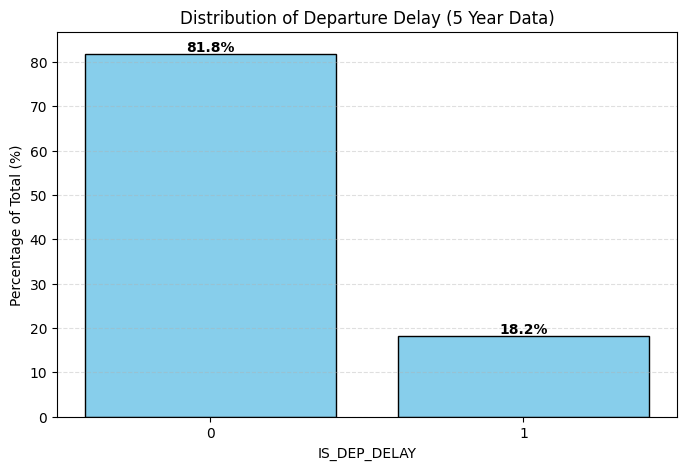

In [0]:
# Convert column to Pandas Series
dep_delay_pd = otpw.select("IS_DEP_DELAY").toPandas()

# Calculate normalized (percentage) counts
dep_delay_counts = dep_delay_pd['IS_DEP_DELAY'].value_counts(normalize=True).sort_index() * 100

plt.figure(figsize=(8,5))
plt.bar(dep_delay_counts.index.astype(str), dep_delay_counts.values, color='skyblue', edgecolor='black')

# Add % labels on top of each bar
for i, v in enumerate(dep_delay_counts.values):
    plt.text(i, v + 0.5, f"{v:.1f}%", ha='center', fontweight='bold')

plt.title(f'Distribution of Departure Delay ({duration} Data)')
plt.xlabel('IS_DEP_DELAY')
plt.ylabel('Percentage of Total (%)')
plt.ylim(0, dep_delay_counts.values.max() + 5)
plt.grid(axis='y', linestyle='--', alpha=0.4)

plt.show()


## Correlation Test

In [0]:
# Distribution of Numeric Features
display(otpw.select(numeric).summary())


summary,DISTANCE,AIR_TIME,ELEVATION,HourlyAltimeterSetting,HourlyDewPointTemperature,HourlyDryBulbTemperature,HourlyPrecipitation,HourlyRelativeHumidity,HourlySeaLevelPressure,HourlyStationPressure,HourlyVisibility,HourlyWetBulbTemperature,HourlyWindDirection,HourlyWindSpeed,origin_station_dis,dest_station_dis
count,31197330,31197330,31197330,31197330,31197330,31197330,31197330,31197330,31197330,31197330,31197330,31197330,31197330,31197330,31197330,31197330
mean,824.6452092534842,113.70508739049143,249.77233416243772,30.027719947445,47.617662344822456,63.99604623216153,0.0026599465283833616,60.41551334681525,30.01808859844701,29.15371259154518,9.447736675453788,55.30921261531035,177.52668356554872,9.054767891995885,0.07390688661528644,0.2692401074211331
stddev,608.4185290617731,72.0974864230021,398.0724219545374,0.18357544627418557,18.517673356960984,18.673523138888456,0.026847325543290664,21.619518183996256,0.18790653425886883,1.313846788800915,1.8246251027118807,15.677973152601151,105.2793572062429,5.633770782557455,11.171703287471631,26.542694788168262
min,21.0,4.0,0.3,28.17,-47.0,-51.0,0.0,1.0,28.37,19.79,0.0,-38.0,0.0,0.0,0.0,0.0
25%,373.0,61.0,9.4,29.92,34.0,52.0,0.0,45.0,29.91,29.05,10.0,45.0,90.0,6.0,0.0,0.0
50%,651.0,95.0,148.7,30.02,50.0,67.0,0.0,62.0,30.01,29.5,10.0,58.0,180.0,8.0,0.0,0.0
75%,1065.0,144.0,269.1,30.13,63.0,78.0,0.0,77.0,30.12,29.92,10.0,68.0,260.0,13.0,0.0,0.0
max,5095.0,1557.0,2353.1,31.09,95.0,125.0,5.76,100.0,31.3,31.02,99.42,98.0,360.0,2237.0,2553.868,3152.098


In [0]:
# def plot_distributions(df, cols, bins=40, ncols=4):
#     import matplotlib.pyplot as plt
#     import math

#     n = len(cols)
#     nrows = math.ceil(n / ncols)

#     fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 4*nrows))
#     axes = axes.flatten()

#     for i, c in enumerate(cols):
#         edges, counts = df.select(c).rdd.flatMap(lambda x: x).histogram(bins)
#         axes[i].bar(edges[:-1], counts, width=(edges[1]-edges[0]), align='edge')
#         axes[i].set_title(c)

#     # clean unused
#     for j in range(i+1, len(axes)):
#         fig.delaxes(axes[j])

#     plt.tight_layout()
#     plt.show()

# plot_distributions(otpw, numeric)


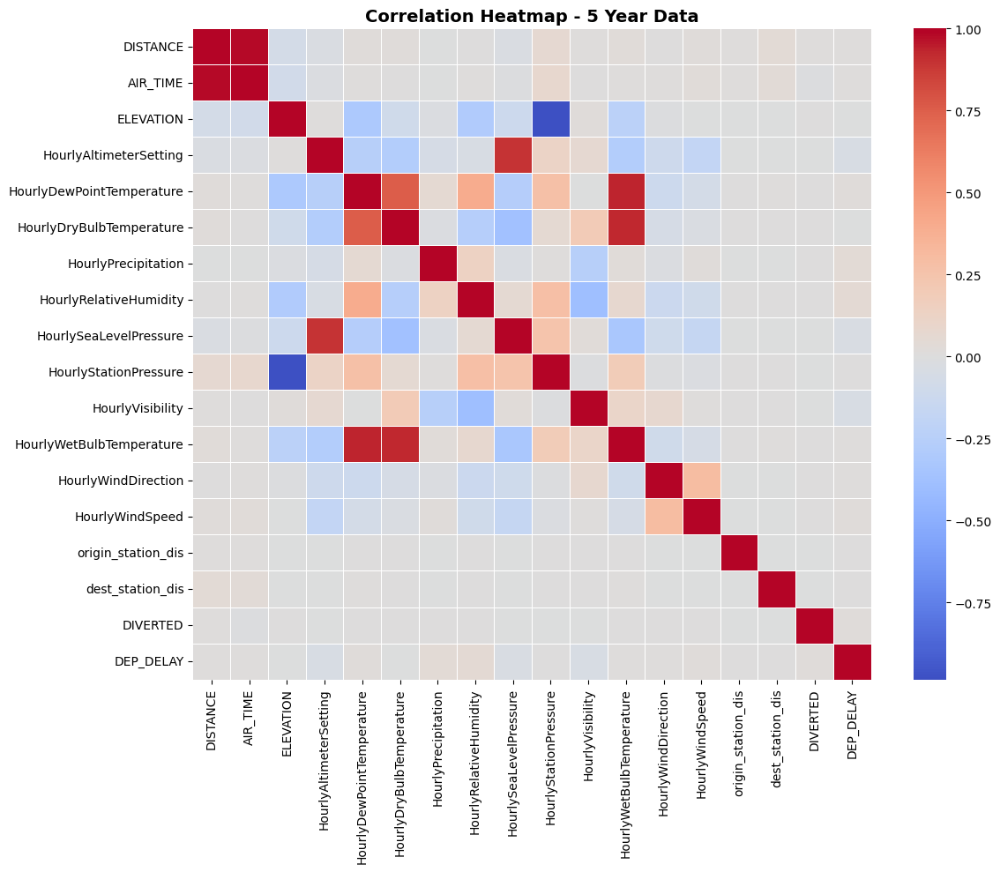

In [0]:
# Select numeric columns and target, convert to Pandas
corr_features = numeric + binary + ['DEP_DELAY']
df_corr = otpw.select(corr_features).toPandas()

# Compute correlation matrix
corr_matrix = df_corr.corr(numeric_only=True)

# Plot heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, cmap='coolwarm', center=0, linewidths=0.5)
plt.title(f'Correlation Heatmap - {duration} Data', fontsize=14, weight='bold')
plt.tight_layout()
plt.show()


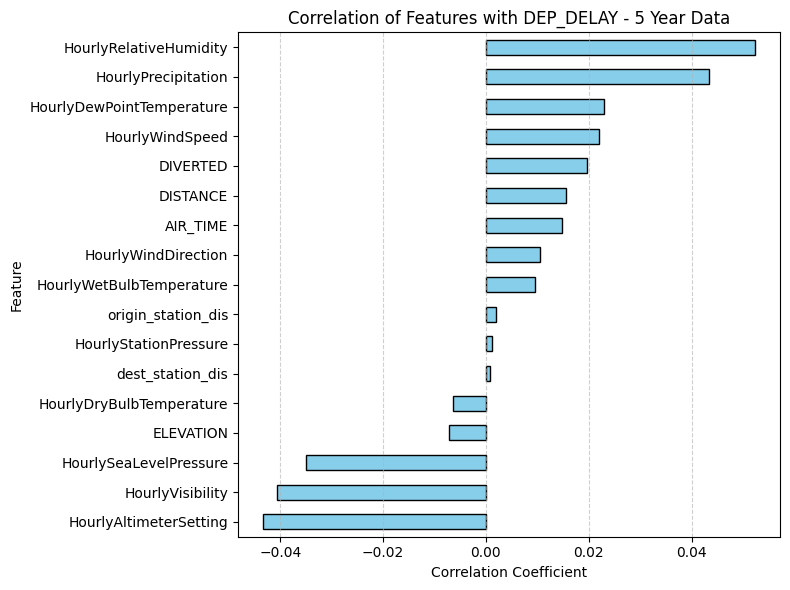

In [0]:
target_corr = corr_matrix['DEP_DELAY'].sort_values(ascending=False)

plt.figure(figsize=(8, 6))
target_corr.drop(['IS_DEP_DELAY', 'DEP_DELAY'], errors='ignore').sort_values(ascending=False).plot(
    kind='barh', color='skyblue', edgecolor='black'
)
plt.title(f'Correlation of Features with DEP_DELAY - {duration} Data')
plt.xlabel('Correlation Coefficient')
plt.ylabel('Feature')
plt.gca().invert_yaxis()  # Highest correlation at top
plt.grid(axis='x', linestyle='--', alpha=0.6)
plt.tight_layout()
plt.show()

In [0]:
threshold = 0.03
print("Here's the list of features with correlation above the threshold:")
print(target_corr[target_corr.abs() > threshold].reindex(
    target_corr[target_corr.abs() > threshold].abs().sort_values(ascending=False).index
))

Here's the list of features with correlation above the threshold:
DEP_DELAY                 1.000000
HourlyRelativeHumidity    0.052416
HourlyAltimeterSetting   -0.043423
HourlyPrecipitation       0.043406
HourlyVisibility         -0.040681
HourlySeaLevelPressure   -0.035072
Name: DEP_DELAY, dtype: float64


## Total Delay flights by Month

In [0]:
# df = (
#     otpw
#     .select(['FL_DATE', 'IS_DEP_DELAY'])
#     .groupBy('FL_DATE')
#     .agg(
#         F.mean('IS_DEP_DELAY').alias('TOTAL_DELAY'),
#         # F.mean('CANCELLED').alias('TOTAL_CANCEL')
#     )
#     .orderBy('FL_DATE')
# ).toPandas()


# fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6), sharex=True)

# # Total Departure Delay
# ax1.plot(df['FL_DATE'], df['TOTAL_DELAY'],
#          color='skyblue', marker='o', linestyle='-', label='Total Departure Delay')
# ax1.set_title('Total Departure Delay by Date - 3 Month Data')
# ax1.set_xlabel('Date')
# ax1.set_ylabel('Total Departure Delay')
# ax1.grid(axis='y', linestyle='--', alpha=0.4)

# # Total Canceled Flights
# ax2.plot(df['FL_DATE'], df['TOTAL_CANCEL'],
#          color='salmon', marker='x', linestyle='--', label='Total Canceled Flights')
# ax2.set_title('Total Canceled Flights by Date - 3 Month Data')
# ax2.set_xlabel('Date')
# ax2.set_ylabel('Total Canceled Flights')
# ax2.grid(axis='y', linestyle='--', alpha=0.4)

# # Final styling
# for ax in (ax1, ax2):
#     ax.tick_params(axis='x', rotation=45)

# plt.tight_layout()
# plt.show()



## Time Series Decomposition for Total Departure

DATE,FL_DATE,YEAR,MONTH,QUARTER,DAY_OF_MONTH,DAY_OF_WEEK,DEP_TIME,CRS_DEP_TIME,CRS_ARR_TIME,DEP_TIME_BLK,four_hours_prior_depart_UTC,two_hours_prior_depart_UTC,origin_airport_lat,origin_airport_lon,dest_airport_lat,dest_airport_lon,OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,ORIGIN,origin_type,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,DEST,dest_type,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DISTANCE_GROUP,FLIGHTS,DISTANCE,AIR_TIME,ELEVATION,HourlyAltimeterSetting,HourlyDewPointTemperature,HourlyDryBulbTemperature,HourlyPrecipitation,HourlyRelativeHumidity,HourlySeaLevelPressure,HourlyStationPressure,HourlyVisibility,HourlyWetBulbTemperature,HourlyWindDirection,HourlyWindSpeed,origin_station_dis,dest_station_dis,DIVERTED,DEP_DELAY_GROUP,DEP_DELAY,HourlySkyConditions,IS_DEP_DELAY


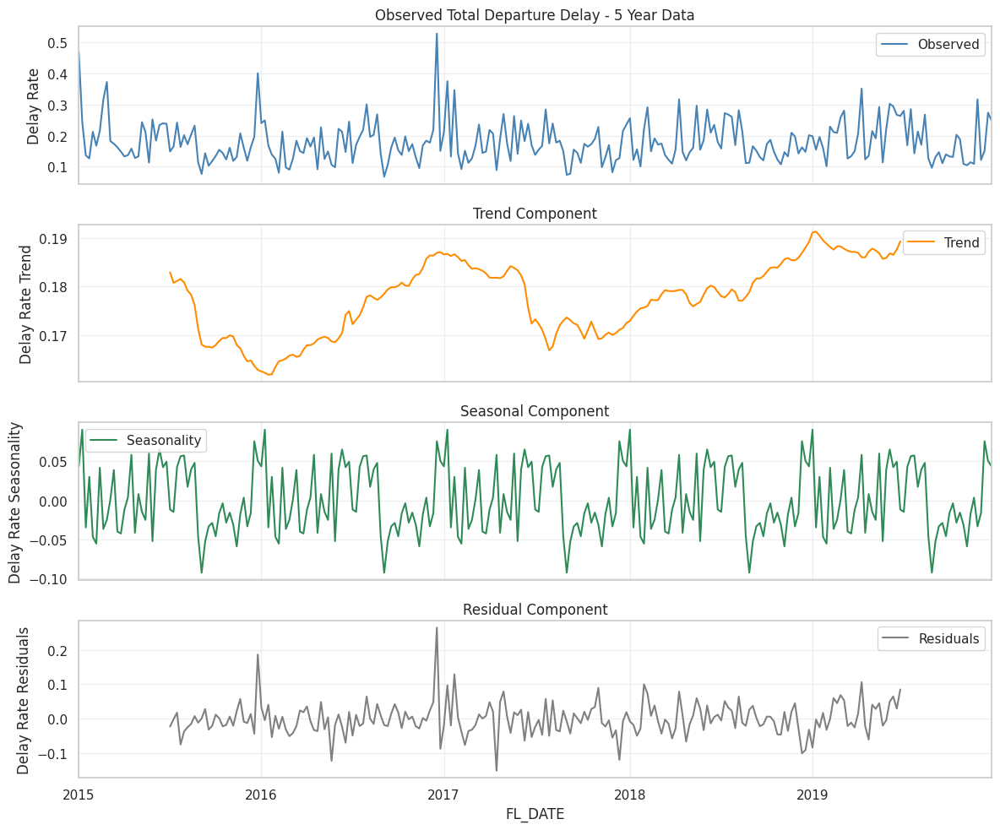

In [0]:
from statsmodels.tsa.seasonal import seasonal_decompose

df = (
    otpw
    .select(['FL_DATE', 'IS_DEP_DELAY'])
    .groupBy('FL_DATE')
    .agg(F.mean('IS_DEP_DELAY').alias('TOTAL_DELAY'))
    .orderBy('FL_DATE')
).toPandas()

df['FL_DATE'] = pd.to_datetime(df['FL_DATE'])
df = df.set_index('FL_DATE').asfreq('W')
df['TOTAL_DELAY'] = df['TOTAL_DELAY'].interpolate('linear').bfill().ffill()

result = seasonal_decompose(df['TOTAL_DELAY'], model='additive', period=52)

sns.set_theme(style="whitegrid")

fig, axes = plt.subplots(4, 1, figsize=(12, 10), sharex=True)

# Observed
result.observed.plot(ax=axes[0], color='steelblue', label='Observed')
axes[0].set_title(f'Observed Total Departure Delay - {duration} Data')
axes[0].set_ylabel("Delay Rate")
axes[0].legend()

# Trend
result.trend.plot(ax=axes[1], color='darkorange', label='Trend')
axes[1].set_title('Trend Component')
axes[1].set_ylabel("Delay Rate Trend")
axes[1].legend()

# Seasonality
result.seasonal.plot(ax=axes[2], color='seagreen', label='Seasonality')
axes[2].set_title('Seasonal Component')
axes[2].set_ylabel("Delay Rate Seasonality")
axes[2].legend()

# Residuals
result.resid.plot(ax=axes[3], color='gray', label='Residuals')
axes[3].set_title('Residual Component')
axes[3].set_ylabel("Delay Rate Residuals")
axes[3].legend()

for ax in axes:
    ax.grid(alpha=0.3)
    ax.tick_params(axis='x')

plt.tight_layout()
plt.show()


- There seems to be a clearer trend for Total Departure Delay than Total Canceled Flights
- However, this graph only shows the first quarter of 2015. It worths plotting time series graph again for one year data
- In the first quarter of 2015, the trend peaked at the beginning of the new year and February
- Seasonality graph shows a seemingly weekly pattern that tracks flight traffic

## PCA

In [0]:
from pyspark.ml.feature import StringIndexer, OneHotEncoder, FeatureHasher, StandardScaler, PCA, VectorAssembler
from pyspark.ml import Pipeline

# List of categorical features
categorical_cols = flight
numeric_cols = numeric
binary_cols = binary
df_selected = otpw.select(categorical_cols + numeric_cols + binary_cols)

# FeatureHasher for categorical columns
hasher = FeatureHasher(inputCols=categorical_cols, outputCol="cat_features", numFeatures=1024)

# Assemble numeric and binary features
num_bin_cols = numeric_cols + binary_cols
assembler_num = VectorAssembler(inputCols=num_bin_cols, outputCol="num_bin_features")

# StandardScaler for numeric + binary features
scaler = StandardScaler(inputCol="num_bin_features", outputCol="scaled_num_bin_features", withMean=True, withStd=True)

# Assemble hashed categorical + scaled numeric features into final features
final_assembler = VectorAssembler(inputCols=["cat_features", "scaled_num_bin_features"], outputCol="features")

# Build pipeline
pipeline = Pipeline(stages=[hasher, assembler_num, scaler, final_assembler])

# Step 7: Fit pipeline and transform
pipeline_model = pipeline.fit(df_selected)
df_final = pipeline_model.transform(df_selected)

# Now df_final has a 'features' column ready for PCA
df_final.select("features").show(truncate=False)
df_final.cache()

# Apply PCA
k = 20
pca = PCA(k=k, inputCol="features", outputCol="pca_features")
pca_model = pca.fit(df_final)

# Step 3: Transform data to get principal components
df_pca = pca_model.transform(df_final)

# Step 4: Show the PCA features
df_pca.select("pca_features").show(truncate=False)

# Optional: check explained variance for each component
explained_variance = pca_model.explainedVariance
print("Explained variance of each PC:", explained_variance)





Uploading artifacts:   0%|          | 0/4 [00:00<?, ?it/s]

+------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------+
|features                                                                                                                                                                                                                                                                                                                                                                                                                                  

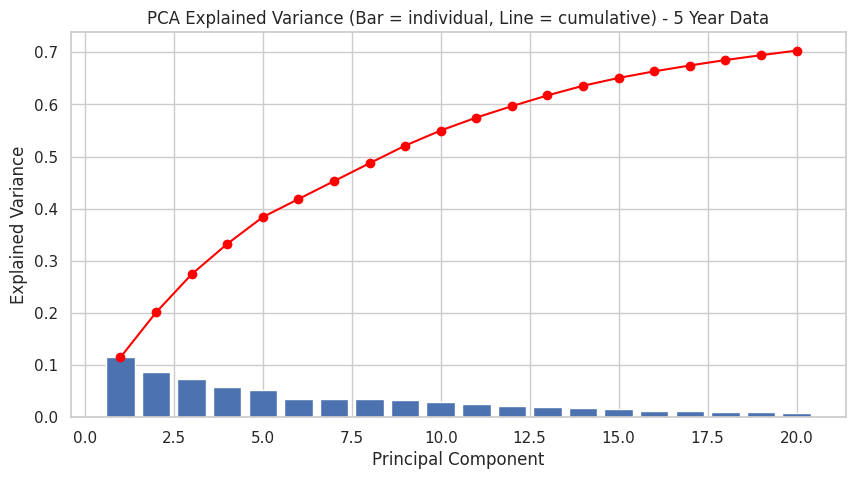

In [0]:
explained_variance = pca_model.explainedVariance.toArray()

# Plot explained variance
plt.figure(figsize=(10, 5))
plt.bar(range(1, len(explained_variance)+1), explained_variance)
plt.plot(range(1, len(explained_variance)+1), np.cumsum(explained_variance), color='red', marker='o')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance')
plt.title(f'PCA Explained Variance (Bar = individual, Line = cumulative) - {duration} Data')
plt.show()



In [0]:
# Convert the PC matrix to numpy
pc_matrix = pca_model.pc.toArray()  # shape: (num_features, k)

# Numeric + binary feature indices
num_bin_start = 1024  # FeatureHasher output size
num_bin_end = num_bin_start + len(num_bin_cols)

# Extract loadings for numeric + binary features
num_bin_loadings = pc_matrix[num_bin_start:num_bin_end, :]  # shape: (num_numeric_features, k)

# convert to data frame
df_loadings = pd.DataFrame(num_bin_loadings, index=num_bin_cols,
                           columns=[f"PC{i+1}" for i in range(num_bin_loadings.shape[1])])

# Show top 20 rows (or all if less than 20)
df_loadings['PC1_abs'] = df_loadings['PC1'].abs()
display(df_loadings.reset_index().sort_values('PC1_abs', ascending=False).head(20))

index,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,PC17,PC18,PC19,PC20,PC1_abs
HourlyWetBulbTemperature,0.5094923136413346,0.0689387064322079,0.07343636655956141,0.16224097107609595,-0.1127111757054053,0.028518521326021087,-6.208777125690787E-5,-0.016374578269906206,-0.14962871688959153,0.11974637959079104,0.01964482472339962,-0.03504237795291843,-0.047711103151267836,0.01979316292166877,-0.049436593481084264,-0.03584963485883793,0.0039819462409673425,0.007572863897963628,0.0361568563314045,-0.005814619654773253,0.5094923136413346
HourlyDewPointTemperature,0.4999225426397953,-0.044455856495577685,0.10610494046390608,0.01878099993360165,-0.16512191988076907,0.020128030328794778,-5.03498278444052E-4,-0.009136966477965568,-0.09677587224828967,0.2713473123729476,0.030503783814297487,0.0013707348564374984,0.13371016052657417,0.02518152913083931,-0.04201470755333266,-0.04197749507694927,0.014902416117190216,0.010397114638882338,0.01644194323878859,-0.0221989606457549,0.4999225426397953
HourlyDryBulbTemperature,0.4543899096720984,0.1898330394246312,0.03050375024785006,0.28230910356417555,-0.04988055688989098,0.03310722938376181,7.07029661289959E-4,-0.02098122608218599,-0.18012951479567885,-0.03771081914876627,0.005367381103178386,-0.06653996113704987,-0.22988467162774628,0.014487612817870274,-0.05748182782322608,-0.023714307276964757,-0.009703255540868467,0.009489563693224084,0.04410260789002485,-0.00350489423044409,0.4543899096720984
HourlySeaLevelPressure,-0.26423797008154676,-0.401936621771859,0.11137784637628659,0.3137671950586825,-0.10555512139203682,0.057052837891892694,0.00755605563275728,-0.02151618595567235,-0.27411721677592604,0.16832525500065398,-0.011649561366948181,-0.058754164811527634,-0.011998543098902184,0.027916214874282908,-0.060076278596590725,-0.011087950217512292,0.016004220571147233,0.01087150507717683,0.006318997579757606,-0.005839814164292736,0.26423797008154676
HourlyAltimeterSetting,-0.2615519051372763,-0.3203434285854615,0.10281944929017771,0.39423171761511666,-0.1600101126282022,0.06618878062231037,0.007883288480691288,-0.027505200852273166,-0.32207798831853846,0.1953265439992505,-0.007960116321999411,-0.08860413368515156,-0.046711788719376625,0.040102703379673976,-0.07162174169036803,-0.013892526170970386,0.024175563734423006,-0.021865965034945735,0.009387723069173048,0.00931994670112482,0.2615519051372763
ELEVATION,-0.24330660664481585,0.4689609826020158,-0.06564983599047787,0.05081559477877687,-0.3346601540919501,0.0254082976028441,0.0012553908981580498,-0.010817417967121438,-0.13091736969741768,0.2256539455323056,0.021352252611426738,-0.019908274060884672,0.0912000715158592,-0.003876665883522791,-0.0018165455386702496,3.568565856242586E-4,-0.003938979702284839,-0.0038317657515090134,0.0089645259466498,0.031237053189826995,0.24330660664481585
HourlyStationPressure,0.20460432443541976,-0.5104229307583988,0.08108145818245904,0.00501150047129963,0.3087096676784439,-0.015902694942411918,-3.6009397512188355E-5,0.007402482057320961,0.08444229805532237,-0.19575428077805898,-0.028068092445404105,0.008614307691231294,-0.09254496240867732,0.01123648916850856,-0.005145271635403409,0.004192270897628386,-0.0025198001289846077,0.01339101176467062,-1.944007560959929E-4,-0.008786807078446078,0.20460432443541976
HourlyRelativeHumidity,0.10669264068302847,-0.3022925059697917,0.10818170531458887,-0.43283928910660674,-0.23018699693719574,-0.02092377771911284,-0.0026099991940814775,0.014933521216482655,0.13123252800304044,0.4305384636934786,0.06027594767040686,0.05914413012758699,0.4552959736729518,0.023192428035323707,-7.209878275245632E-4,-0.03374785405369773,0.052231959293063596,0.014199638913159125,-0.027314886557002177,0.004697943891287826,0.10669264068302847
DISTANCE,0.06988078451544583,-0.14509720567366033,-0.6479566191628505,0.03446413854289156,-0.11794502288975625,0.012763113585876135,0.010898995104792948,-0.029766804256952394,-0.0026301175025161233,0.011592515888470824,0.0236058333454488

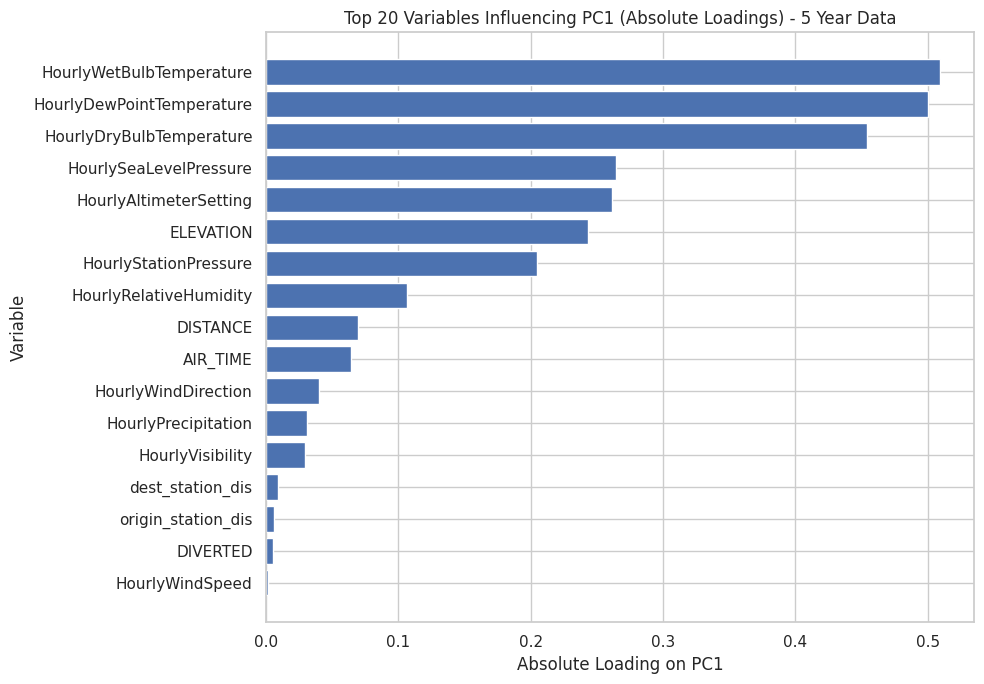

In [0]:
# --- Sort and take top 20 absolute loadings ---
df_top20 = (
    df_loadings
    .assign(PC1_abs=lambda x: x['PC1'].abs())
    .sort_values('PC1_abs', ascending=False)
    .head(20)
)

# Sort for nicer plotting order (largest on top)
df_top20 = df_top20.sort_values('PC1_abs', ascending=True)

# --- Plot ---
plt.figure(figsize=(10, 7))
plt.barh(df_top20.index, df_top20['PC1_abs'])
plt.xlabel("Absolute Loading on PC1")
plt.ylabel("Variable")
plt.title(f"Top 20 Variables Influencing PC1 (Absolute Loadings) - {duration} Data")
plt.tight_layout()
plt.show()


## Average Half-Hourly Delay Time Series (by Local Time)

In [0]:
df = (otpw.select("CRS_DEP_TIME", "IS_DEP_DELAY")
      .withColumn("CRS_DEP_TIME_PADDED", F.lpad(F.col("CRS_DEP_TIME"), 4, "0"))
      .withColumn("CRS_DEP_TIME_HOUR", F.substring(F.col("CRS_DEP_TIME_PADDED"), 1, 2).cast("int"))
      .withColumn("CRS_DEP_TIME_MIN", F.substring(F.col("CRS_DEP_TIME_PADDED"), 3, 2).cast("int"))
      .withColumn("CRS_DEP_TIME_FMT", F.concat_ws(":", 
                F.lpad(F.col("CRS_DEP_TIME_HOUR").cast("string"), 2, "0"), 
                F.lpad(F.col("CRS_DEP_TIME_MIN").cast("string"), 2, "0")))
      .withColumn("CRS_DEP_HALF_HOUR", (F.col("CRS_DEP_TIME_HOUR") * 2 + (F.col("CRS_DEP_TIME_MIN") / 30).cast("int")).cast("int"))
      .withColumn(
            "CRS_DEP_BUCKET_LABEL",
            F.concat_ws(
                  ":",
                  F.lpad((F.floor(F.col("CRS_DEP_HALF_HOUR") / 2)).cast("string"), 2, "0"),
                  F.when((F.col("CRS_DEP_HALF_HOUR") % 2) == 0, F.lit("00")).otherwise(F.lit("30"))
                  )
            )
      )



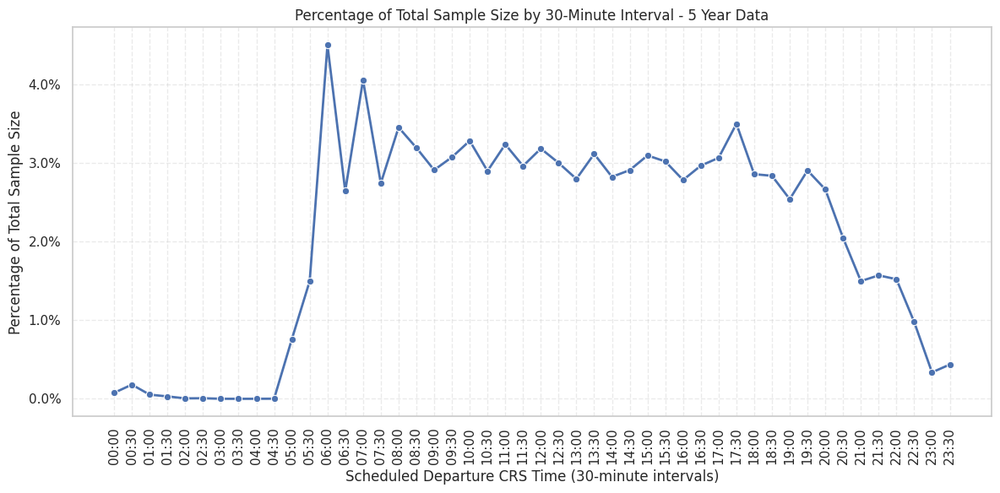

In [0]:
# Break into half hour bucket
total_count = df.count()

df_halfhour_pct = (
    df.groupBy("CRS_DEP_BUCKET_LABEL")
      .agg((F.count("*") / total_count).alias("Sample_Percent"))
      .orderBy("CRS_DEP_BUCKET_LABEL")
      .toPandas()
)

# Visualization
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=df_halfhour_pct,
    x="CRS_DEP_BUCKET_LABEL",
    y="Sample_Percent",
    marker="o",
    linewidth=2
)

plt.xticks(rotation=90)
plt.xlabel("Scheduled Departure CRS Time (30-minute intervals)")
plt.ylabel("Percentage of Total Sample Size")
plt.title(f"Percentage of Total Sample Size by 30-Minute Interval - {duration} Data")
plt.gca().yaxis.set_major_formatter(lambda x, _: f"{x:.1%}")
plt.grid(True, linestyle="--", alpha=0.4)
plt.tight_layout()
plt.show()



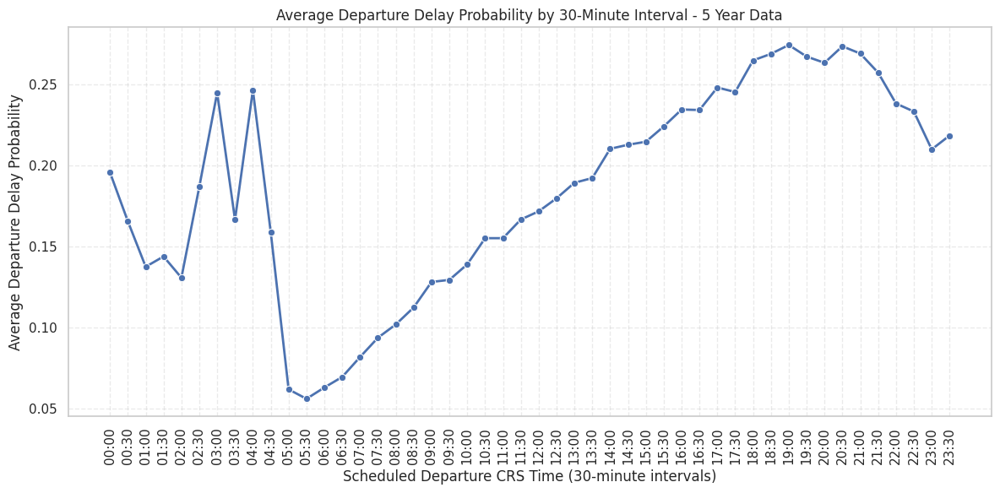

In [0]:
# Break into half hour bucket
df_halfhour = (
    df.groupBy("CRS_DEP_BUCKET_LABEL")
      .agg(F.mean("IS_DEP_DELAY").alias("mean_IS_DEP_DELAY"))
      .orderBy("CRS_DEP_BUCKET_LABEL")
      .toPandas()
)

# Visualization
plt.figure(figsize=(12, 6))
sns.lineplot(
    data=df_halfhour,
    x="CRS_DEP_BUCKET_LABEL",
    y="mean_IS_DEP_DELAY",
    marker="o",
    linewidth=2
)

plt.xticks(rotation=90)
plt.xlabel("Scheduled Departure CRS Time (30-minute intervals)")
plt.ylabel("Average Departure Delay Probability")
plt.title(f"Average Departure Delay Probability by 30-Minute Interval - {duration} Data")
plt.grid(True, linestyle="--", alpha=0.4)
plt.tight_layout()
plt.show()

## XGBoost

In [0]:
# from pyspark.ml.feature import VectorAssembler
# from xgboost.spark import SparkXGBClassifier
# from pyspark.ml.evaluation import BinaryClassificationEvaluator

# # Define features and target
# features = ['HourlyWetBulbTemperature', 'HourlyDewPointTemperature',
#      'HourlyDryBulbTemperature', 'HourlySeaLevelPressure',
#      'HourlyAltimeterSetting', 'ELEVATION', 'MONTH', 'HourlyStationPressure',
#      'DISTANCE', 'TAXI_OUT', 'HourlyRelativeHumidity', 'AIR_TIME',
#      'HourlyWindDirection', 'HourlyWindSpeed', 'DAY_OF_MONTH',
#      'HourlyPrecipitation', 'TAXI_IN', 'dest_station_dis', 'origin_station_dis', 
#      'CANCELLED', 'DAY_OF_WEEK', 'HourlyVisibility', 'DIVERTED', 'FLIGHTS', 'YEAR', 'QUARTER']
# df = otpw.select(features+['IS_DEP_DELAY'])

# # Transform the whole data
# XGBAssembler = VectorAssembler(inputCols=features, outputCol="features")
# df = XGBAssembler.transform(df)

# # Train test split
# train_df, test_df = df.randomSplit([0.8, 0.2], seed=42)

# # Define appropriate scale_pos_weight
# ratio = df.filter(F.col("IS_DEP_DELAY") == 0).count() / df.filter(F.col("IS_DEP_DELAY") == 1).count()
# print(f"scale_pos_weight should be roughly: {ratio:.2f}")

 
# # Train the model
# XGB_classifier = SparkXGBClassifier(
#     features_col="features",
#     label_col="IS_DEP_DELAY",
#     eval_metric="auc",
#     num_workers=4,
#     max_depth=5,
#     learning_rate=0.1,
#     n_estimators=300,
#     subsample=0.8,
#     colsample_bytree=0.8,
#     scale_pos_weight=ratio  # adjust based on delay ratio
# )

# model = XGB_classifier.fit(train_df)

# preds = model.transform(test_df)

# evaluator = BinaryClassificationEvaluator(
#     labelCol="IS_DEP_DELAY",
#     rawPredictionCol="probability",
#     metricName="areaUnderROC"
#     )

# auc = evaluator.evaluate(preds)
# print(f"AUC = {auc:.3f}")

# # Feature Importance Extraction
# booster = model.get_booster()
# importances = booster.get_score(importance_type='gain')

# feature_importance = (
#     pd.DataFrame({
#         'feature': features,
#         'importance': [importances.get(f"f{i}", 0) for i in range(len(features))]
#     })
#     .sort_values(by='importance', ascending=False)
# )
# print(feature_importance.head(10))

